In [1]:
# !pip install icevision[all,dev]

In [2]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

## Imports

In [3]:
from icevision.all import *
from fastai.callback.wandb import *
from fastai.callback.tracker import SaveModelCallback
import wandb
from datetime import *

In [4]:
# #Download Datset 
# #Uncomment on first use to download and extract dataset
# from pydrive.auth import GoogleAuth
# from pydrive.drive import GoogleDrive
# from google.colab import auth
# from oauth2client.client import GoogleCredentials

# auth.authenticate_user()
# gauth = GoogleAuth()
# gauth.credentials = GoogleCredentials.get_application_default()
# drive = GoogleDrive(gauth)

# downloaded = drive.CreateFile({'id':"1BCqjhvI9k6h65qM6ZLTwXgdzRVH08tFD"})  
# downloaded.GetContentFile('WSI_PATCHES.7z') 

# #Unpack zip
# !p7zip -d WSI_PATCHES.7z


7-Zip (a) [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.20GHz (406F0),ASM,AES-NI)

Scanning the drive for archives:
  0M Sca        1 file, 72029910 bytes (69 MiB)

Extracting archive: WSI_PATCHES.7z
--
Path = WSI_PATCHES.7z
Type = 7z
Physical Size = 72029910
Headers Size = 1125
Method = LZMA2:24
Solid = -
Blocks = 38

      8% 1       12% 14 - WSI_PATCHES/Mitosis_1class_768_ . itosis_tf_efficientdet_lite0.p                                                                           17% 14 - WSI_PATCHES/Mitosis_1class_768_ . itosis_tf_efficientdet_lite0.p                                                                           21% 14 - WSI_PATCHES/Mitosis_1class_768_ . itosis_tf_efficientdet_lite0.p                                                                           26% 14 - WSI_PATCHES/Mitosis_1class_768_ . itosis_tf_efficientdet_lite0.p                          

In [5]:
data_dir = Path('./WSI_PATCHES/Mitosis_1class_768_1slide')

In [6]:
parser = parsers.coco(annotations_file=data_dir / "Coco.json",
                     img_dir=data_dir / 'patches',
                     mask=False)

In [7]:
#Parameters

#Class Map
# class_map = ClassMap(['unkown','mitotic figure'])
# class_map = ClassMap(['unkown','granulocyte', 'mitotic figure', 'tumor cell'])
class_map = ClassMap(['unkown','mitotic figure'])


params = dict(
    epochs=20,
    classes=len(class_map),
    class_map=class_map,
    size=768,
    size_trans=768,
    batch_size=4,
    learning_rate=3e-2,
    architecture="RCNN",
    model='restnet18',
    modelclass='FastRCNN',
    infrastructure='Colab GPU'
    )
params.update(dataset="Mitosis_1Class_"+str(params['size']))
params.update(wandb_run_name = "FastRCNNt_SmallDS_2_" + str(params['size']) +"_"+ date.today().strftime("%m%d%Y"))
params.update(project= 'Mitosis02')
# print(params)

size = params['size']
size_trans = params['size_trans']


In [8]:
# Records
train_records, valid_records = parser.parse()

params.update(train_ds_size=len(train_records))
params.update(valid_ds_size=len(valid_records))

INFO     - Autofixing records | icevision.parsers.parser:parse:124


### Visualization
Showing a batch of images with their corresponding boxes and labels

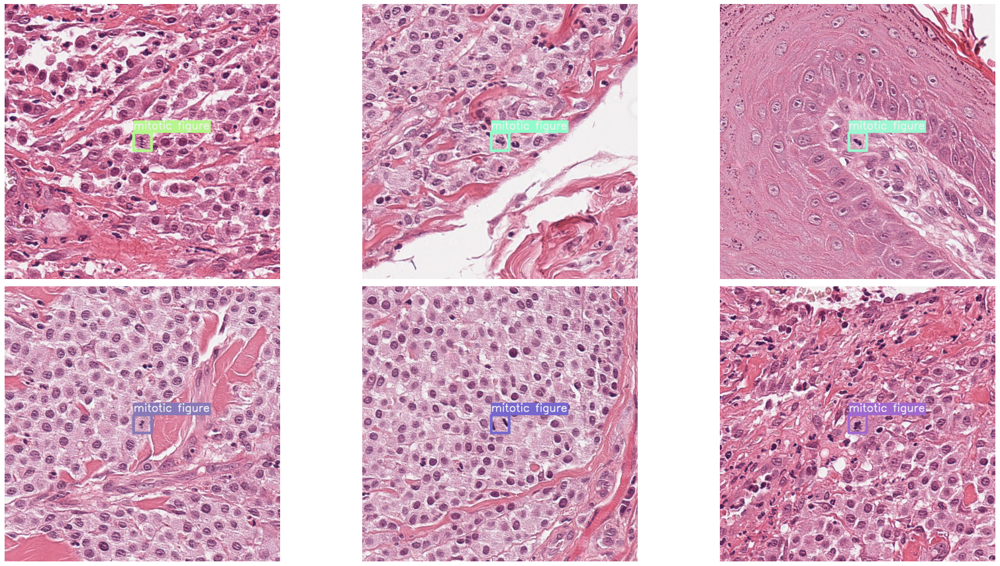

In [9]:
show_records(train_records[:6], ncols=3, class_map=class_map)

In [10]:
# Transforms
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=size_trans, presize=size), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size_trans), tfms.A.Normalize()])

In [11]:
# Datasets
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

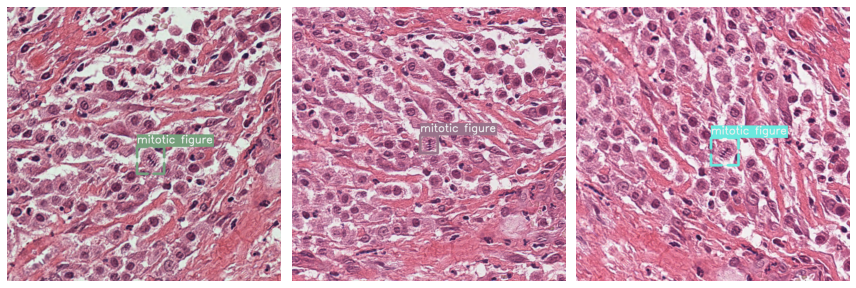

In [12]:
samples = [train_ds[0] for _ in range(3)]
show_samples(samples, ncols=3, class_map=class_map)

## DataLoader

In [13]:
# DataLoaders
train_dl = faster_rcnn.train_dl(train_ds, batch_size=params['batch_size'], num_workers=0, shuffle=True)
valid_dl = faster_rcnn.valid_dl(valid_ds, batch_size=params['batch_size'], num_workers=0, shuffle=False)

train_dl.batch_size

4

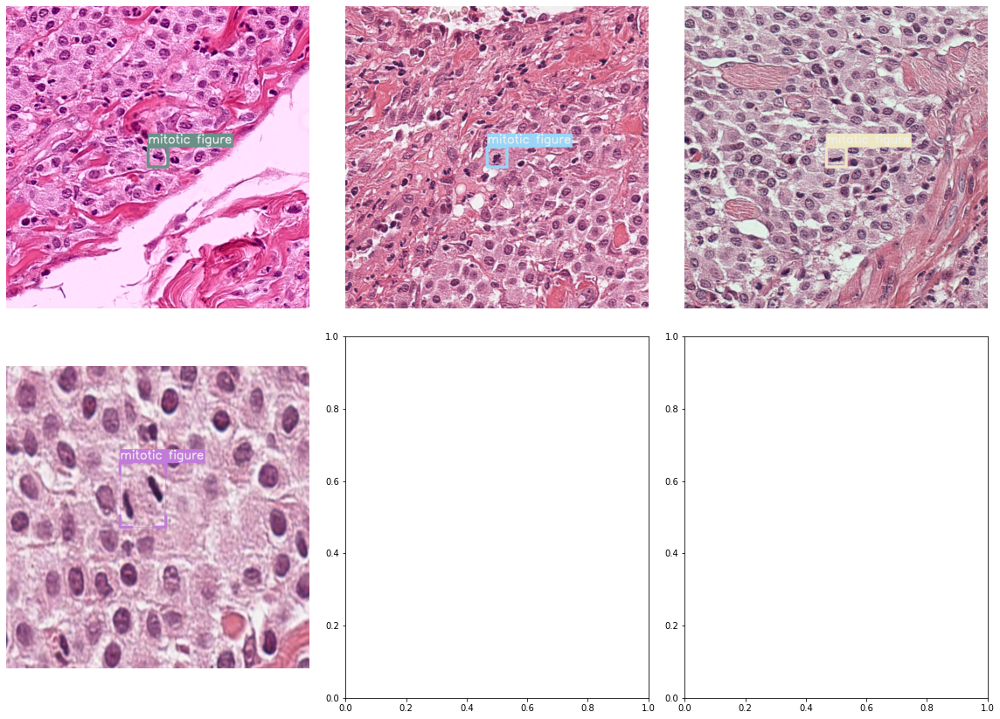

In [14]:
batch, samples = first(train_dl)
show_samples(samples[:6], class_map=class_map, ncols=3)

## Model & Metrics Setup

In [15]:
# Backbones
backbone = backbones.resnet_fpn.resnet18(pretrained=True)

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth


In [16]:
#FasterRCNN Config
model = faster_rcnn.model(backbone=backbone,
                           num_classes=len(class_map))

In [17]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

In [18]:
#WanDB Config
wandb.init(project=params['project'], name=params['wandb_run_name'], config=params)
config = wandb.config

<IPython.core.display.Javascript object>

wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


## Training


In [19]:
# learn = faster_rcnn.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics)
learn = faster_rcnn.fastai.learner(dls=[train_dl, valid_dl], 
                                    model=model, 
                                    metrics=metrics,
                                    cbs=[WandbCallback(log_preds=False, log_dataset=False, log_model=False), SaveModelCallback()]
                                   )

WARNING  - Wandb quickfix implemented, for more info check issue #527 | icevision.models.torchvision_models.fastai.learner:rcnn_learner:39


SuggestedLRs(lr_min=0.00020892962347716094, lr_steep=3.630780702224001e-05)

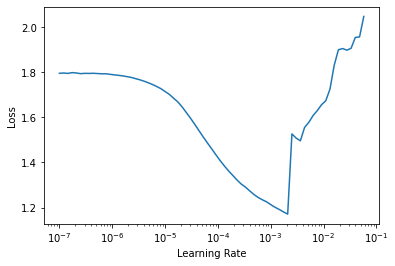

In [20]:
learn.freeze()
learn.lr_find()

In [ ]:
print(config.learning_rate)
print(config.epochs)

0.03
20


In [21]:
learn.fine_tune(20, 3e-4)
# learn.fine_tune(10, 3e-3)
# learn.fine_tune(config.epochs, lr=config.learning_rate)

Could not gather input dimensions


epoch,train_loss,valid_loss,COCOMetric,time
0,1.284286,0.750128,0.000000,00:03


Better model found at epoch 0 with valid_loss value: 0.7501283884048462.
Could not gather input dimensions


epoch,train_loss,valid_loss,COCOMetric,time
0,0.742922,0.720401,0.000000,00:08
1,0.724424,0.641466,0.000000,00:04
2,0.688998,0.531470,0.000000,00:04
3,0.619567,0.242395,0.000000,00:04
4,0.505329,0.081186,0.000000,00:04
5,0.426631,0.118789,0.000000,00:04
6,0.374415,0.089652,0.000000,00:04
7,0.328580,0.101743,0.000000,00:04
8,0.294809,0.074248,0.000000,00:04
9,0.264162,0.052680,0.000000,00:04


Better model found at epoch 0 with valid_loss value: 0.7204006910324097.
Better model found at epoch 1 with valid_loss value: 0.6414661407470703.
Better model found at epoch 2 with valid_loss value: 0.5314695835113525.
Better model found at epoch 3 with valid_loss value: 0.2423953413963318.
Better model found at epoch 4 with valid_loss value: 0.0811857283115387.
Better model found at epoch 8 with valid_loss value: 0.07424779236316681.
Better model found at epoch 9 with valid_loss value: 0.0526803582906723.
Better model found at epoch 10 with valid_loss value: 0.05244126170873642.


SuggestedLRs(lr_min=8.31763736641733e-07, lr_steep=1.9054607491852948e-06)

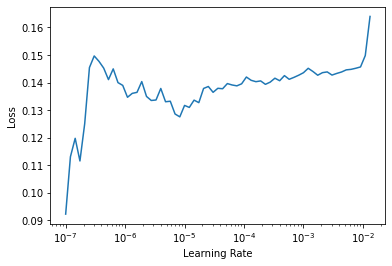

In [22]:
learn.freeze()
learn.lr_find()

In [23]:
learn.unfreeze()
learn.fine_tune(10, 3e-6)

Could not gather input dimensions


epoch,train_loss,valid_loss,COCOMetric,time
0,0.144739,0.052740,0.000000,00:03


Better model found at epoch 0 with valid_loss value: 0.05274006724357605.
Could not gather input dimensions


epoch,train_loss,valid_loss,COCOMetric,time
0,0.137796,0.053461,0.000000,00:04
1,0.147488,0.058110,0.000000,00:04
2,0.143385,0.062709,0.000000,00:04
3,0.148519,0.068822,0.000000,00:04
4,0.147390,0.069082,0.000000,00:04
5,0.145792,0.069103,0.000000,00:04
6,0.145495,0.067161,0.000000,00:04
7,0.142800,0.067028,0.000000,00:04
8,0.142878,0.068409,0.000000,00:04
9,0.146657,0.068163,0.000000,00:04


Better model found at epoch 0 with valid_loss value: 0.05346051603555679.


## Visualize Predictions

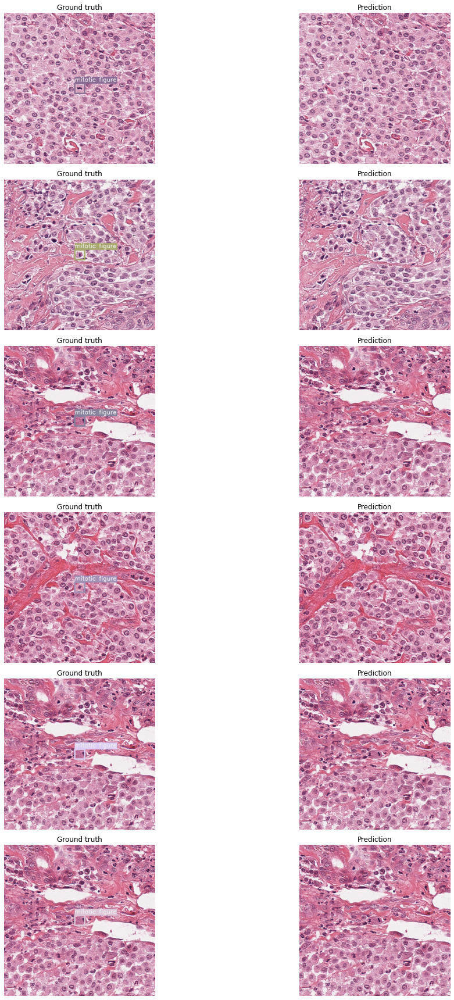

In [24]:
faster_rcnn.show_results(model, valid_ds, class_map=class_map)

In [25]:
valid_test_dl = faster_rcnn.infer_dl(valid_ds, batch_size=params['batch_size'])
samples, preds = faster_rcnn.predict_dl(model, valid_test_dl)

In [26]:
wandb_images = wandb_img_preds(samples[:10], preds[:10], class_map, add_ground_truth=True) 

In [27]:
wandb.log({"Validation Images Prediction-" + str(size_trans) + "px": wandb_images})
# wandb.join()

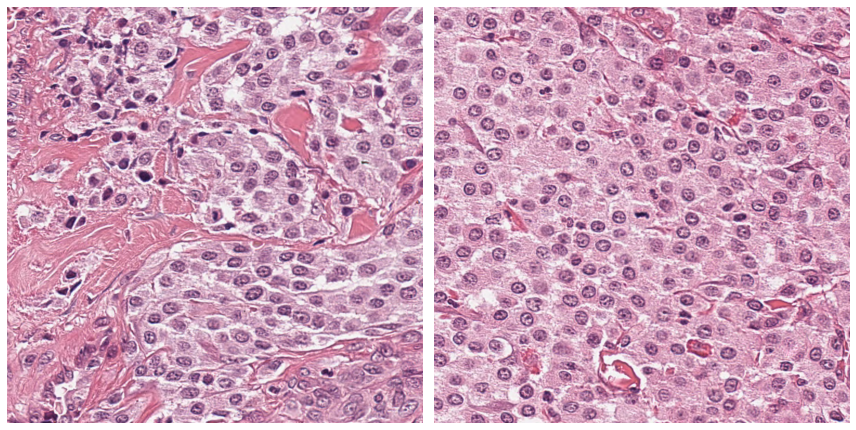

In [28]:
# Show inference on validation dataset
imgs = [sample["img"] for sample in samples]
imgs=imgs[:2]
show_preds(
    imgs,
    preds=preds[:2],
    class_map=class_map,
    denormalize_fn=denormalize_imagenet,
    ncols=2,
)

In [29]:
#Save model weights
model_saved = params['wandb_run_name'] + '-ep30' + '.pth'
torch.save(model.state_dict(), data_dir/model_saved)

## Prediction from Saved Model

In [30]:
print(class_map)

<ClassMap: {'background': 0, 'unkown': 1, 'mitotic figure': 2}>


In [37]:
data_dir_test = Path('./WSI_PATCHES/MitosisTest_768px_2ds')
size_test = '768px'

(2, 768, 768, 3)

In [38]:
test_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size_trans), tfms.A.Normalize()])
infer_ds = Dataset.from_images(images, test_tfms)

In [2]:
parser_tst = parsers.coco(annotations_file=data_dir_test / 'Coco.json',
                     img_dir=data_dir_test / 'patches',
                     mask=False)

In [ ]:
test_records = parser_tst.parse(data_splitter=SingleSplitSplitter())
test_records = test_records[0]
len(test_records)

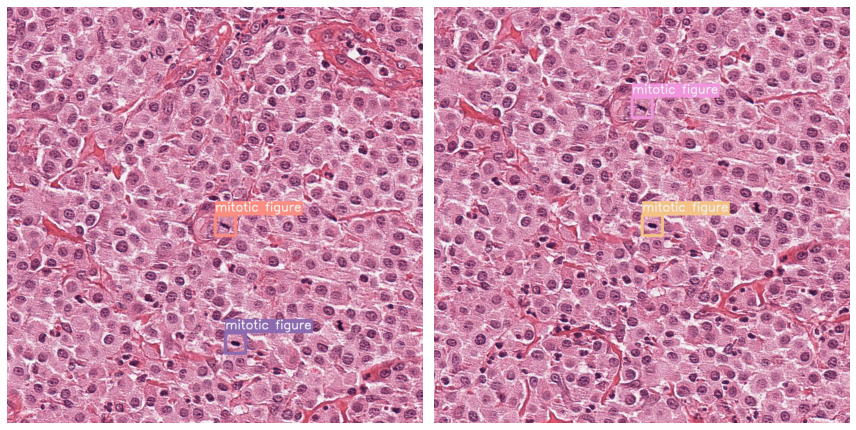

In [ ]:
show_records(test_records, ncols=2, class_map=class_map)

In [ ]:
test_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size), tfms.A.Normalize()])
test_infer_ds = Dataset(test_records, test_tfms)

In [ ]:
#Load Model
model2 = faster_rcnn.model(backbone=backbone, num_classes=len(class_map))
state_dict = torch.load(data_dir/model_saved)
model2.load_state_dict(state_dict)


<All keys matched successfully>

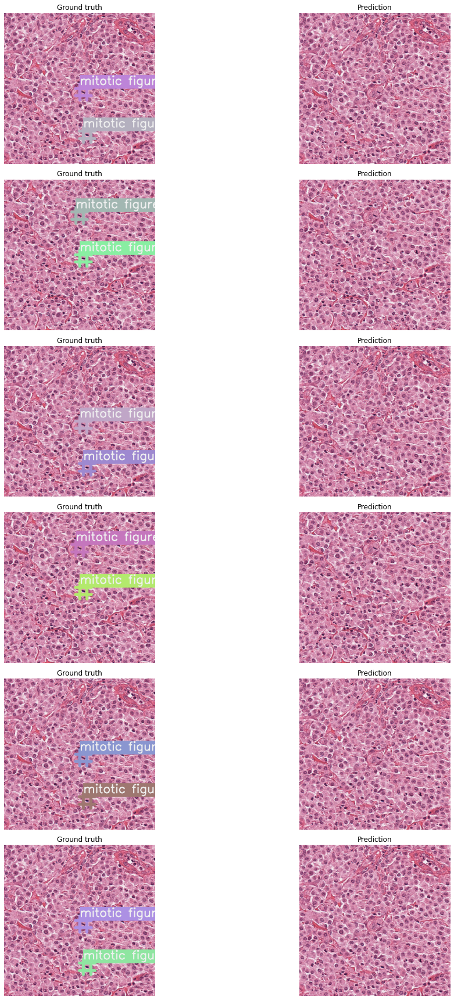

In [ ]:
faster_rcnn.show_results(model, test_infer_ds, class_map=class_map)

In [ ]:
infer_dl = faster_rcnn.infer_dl(test_infer_ds, batch_size=1)
samples_inf, preds_inf = faster_rcnn.predict_dl(model=model2, infer_dl=infer_dl)

RuntimeError: Input type (torch.cuda.FloatTensor) and weight type (torch.FloatTensor) should be the same

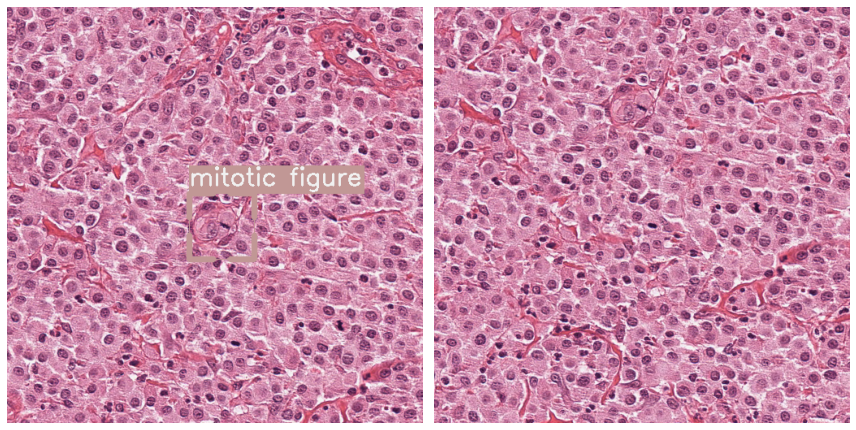

In [ ]:
# Show samples
imgs = [sample["img"] for sample in samples_inf]
imgs=imgs[:4]
show_preds(
    imgs,
    preds=preds_inf[:4],
    class_map=class_map,
    denormalize_fn=denormalize_imagenet,
    ncols=2,
)

In [ ]:
# wandb_images_test = wandb_img_preds(samples_inf, preds_inf, class_map, add_ground_truth=False) 

In [ ]:
# wandb.log({"Test Image Predictions-" + size_test: wandb_images_test})
# wandb.join()

epoch,32
train_loss,0.38783
raw_loss,0.46131
wd_0,0.01
sqr_mom_0,0.99
lr_0,0.0
mom_0,0.95
eps_0,1e-05
wd_1,0.01
sqr_mom_1,0.99
lr_1,0.0


epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
train_loss,█▇▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,█▇▆▅▃▃▄▄▃▃▂▃▃▃▃▃▄▃▃▂▄▃▂▃▂▄▂▁▁▁▁▂▂▃▃▃▂▄▂▃
wd_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
sqr_mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▄█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▅▁█▇▅▄▂▁▁▁▁▁▂▂▃▃▄▄▅▆▆▇▇███▇█▇▄▁▁▁▂▃▅▆▇██
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
wd_1,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
sqr_mom_1,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_1,▄█▂▂▃▃▄▄▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


In [ ]:
wandb.join()

epoch,32
train_loss,0.15226
raw_loss,0.17028
wd_0,0.01
sqr_mom_0,0.99
lr_0,0.0
mom_0,0.95
eps_0,1e-05
wd_1,0.01
sqr_mom_1,0.99
lr_1,0.0


epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
train_loss,█▇▅▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
raw_loss,██▅▂▃▄▄▃▂▂▂▂▂▂▂▁▂▂▃▁▂▃▂▁▁▁▁▂▁▂▁▂▁▁▁▂▂▂▂▂
wd_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
sqr_mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▄█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,▅▁█▇▅▄▂▁▁▁▁▁▂▂▃▃▄▄▅▆▆▇▇███▇█▇▄▁▁▁▂▃▅▆▇██
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
wd_1,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
sqr_mom_1,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_1,▄█▁▁▁▁▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


## Original Infer Routine

In [ ]:
#Load Test Patches
import os
# directory = './WSI_PATCHES/MitosisTest_1024'
# directory = './WSI_PATCHES/MitosisTest_256'
# directory = './WSI_PATCHES/MitosisTest_768'
# directory = './WSI_PATCHES/MitosisTest_768px_2ds'
directory = './WSI_PATCHES/MitosisTest_1024px_2ds'
# directory = '/home/bnapora/development/ml-pipeline/WSI_PATCHES/Mitosis01_256/test_patches_1024'
images = []

for filename in os.listdir(directory):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        imgfile = os.path.join(directory, filename)
        images.append(open_img(imgfile))
    else:
        continue
images = np.array(images)
images.shape

In [ ]:
print('size=',size)
print('size_trans=',size_trans)

In [ ]:
#Transforms used on train/valid ds
# valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size_trans), tfms.A.Normalize()])

test_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size_trans), tfms.A.Normalize()])
infer_ds = Dataset.from_images(images, test_tfms)

In [ ]:
#Load Model

model2 = faster_rcnn.model(model_name='tf_efficientdet_d2', 
                           num_classes=len(class_map), 
                           img_size=size_trans)
state_dict = torch.load(data_dir/model_saved)
model2.load_state_dict(state_dict)
# model2.cpu()  #Don't seem to need to indicate cpu()

In [ ]:
faster_rcnn.show_results(model2, infer_ds, class_map=class_map)

In [ ]:
infer_dl = faster_rcnn.infer_dl(infer_ds, batch_size=1)
samples_inf, preds_inf = faster_rcnn.predict_dl(model=model2, infer_dl=infer_dl)

In [ ]:
# Check to see if predicitons were made
# preds_inf

In [ ]:
for sample in samples_inf:
    imgs = sample['img']
print(imgs.shape)
show_sample(samples_inf[0])

In [ ]:
# Show samples
imgs = [sample["img"] for sample in samples_inf]
imgs=imgs[:4]
show_preds(
    imgs,
    preds=preds_inf[:4],
    class_map=class_map,
    denormalize_fn=denormalize_imagenet,
    ncols=2,
)

In [ ]:
wandb_images_test = wandb_img_preds(samples_inf, preds_inf, class_map, add_ground_truth=False) 

In [ ]:
wandb.log({"Test Image Predictions": wandb_images_test})
wandb.join()